In [54]:
import scanpy as sc
import matplotlib.pyplot as plt
import warnings
import pandas as pd
import numpy as np
warnings.simplefilter("ignore")
import omicverse as ov
ov.plot_set()

Dependency error: The 'phate>=1.0' distribution was not found and is required by the application


In [55]:
sc.logging.print_header()

scanpy==1.10.4 anndata==0.11.3 umap==0.5.7 numpy==1.26.4 scipy==1.11.4 pandas==2.2.3 scikit-learn==1.6.1 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13


In [56]:
adata = sc.read("/home/lugli/spuccio/Projects/SP039/GBmap/TcellCD8_RawData.h5ad")

In [57]:
adata.raw

In [58]:
adata.shape

(12873, 14025)

In [59]:
adata.obs.head()

,donor_id,Author,stage,assay,tissue,Cells,Method,n_genes,nUMIs,annotation_level_1,...,scsa_celltype_cellmarker,scsa_celltype_panglaodb,cell_type,S_score,G2M_score,phase,leiden,cnv_leiden,cnv_score,cnv_status
Cell6,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,1201,1317.797852,Non-neoplastic,...,T cell,T Cells,mature T cell,-0.375458,0.187930,G2M,4,5,0.006147,normal
Cell41,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,865,1227.074585,Non-neoplastic,...,T cell,T Cells,mature T cell,-0.325519,-0.090387,G1,4,5,0.006147,normal
Cell48,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,2784,1757.278076,Neoplastic,...,T cell,T Cells,malignant cell,-0.049835,-0.207362,G1,4,5,0.006147,normal
Cell64,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,1167,1430.446167,Non-neoplastic,...,T cell,T Cells,mature T cell,-0.117193,-0.042341,G1,4,5,0.006147,normal
Cell213,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,862,1266.360229,Non-neoplastic,...,T cell,T Cells,mature T cell,-0.291397,-0.147263,G1,4,5,0.006147,normal


# Check Mt and Ribo genes

In [60]:

print(adata.n_obs, adata.n_vars)
mito_genes = adata.var_names.str.startswith('MT')
ribo_genes = adata.var_names.str.startswith(("RPS","RPL"))
hb_genes = adata.var_names.str.startswith(("^HB[^(P)]"))
remove = np.add(ribo_genes, mito_genes,hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

12873 14025
12873 14025


# Normalization and HVG selection

In [61]:
adata=ov.pp.preprocess(adata,mode='shiftlog|pearson',
                       n_HVGs=2000,batch_key="Author")
adata

Begin robust gene identification
After filtration, 13993/14025 genes are kept.     Among 13993 genes, 13690 genes are robust.
End of robust gene identification.
Begin size normalization: shiftlog and HVGs selection pearson
normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['GNLY', 'HSPA1A']
    finished (0:00:00)
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector (adata.var)
Time to analyze data in cpu: 2.581911563873291 seconds.
End of size normalization: shiftlog and HVGs selection pearson


AnnData object with n_obs × n_vars = 12873 × 13690
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'log1p', 'hvg'
    obsm: 'X_cnv', 'X_harmony', 'X_pca', 'X_umap', 'scaled|original|X_pca'
    layers: 'counts'

# Check HVG list

In [62]:
list(adata[:,adata.var['highly_variable_features'].isin([True])].var.index)

['A2M',
 'ABCA1',
 'ABCA3',
 'ABCB1',
 'ABCD2',
 'ABHD17A',
 'ABHD17B',
 'ABHD18',
 'ABHD3',
 'ABL2',
 'ABLIM1',
 'ABTB1',
 'ACE',
 'ACOT13',
 'ACOT4',
 'ACOT7',
 'ACP2',
 'ACP5',
 'ACP6',
 'ACSL1',
 'ACSL6',
 'ACTA2',
 'ACTB',
 'ACTL6A',
 'ACTR3',
 'ACTR5',
 'ACVR1C',
 'ACVR2A',
 'ADAM17',
 'ADAM19',
 'ADAM23',
 'ADAM28',
 'ADAMDEC1',
 'ADAMTS6',
 'ADAP2',
 'ADGRE2',
 'ADGRE5',
 'ADGRF3',
 'ADGRG1',
 'ADGRG3',
 'ADH5',
 'ADI1',
 'ADM',
 'ADORA2A',
 'ADORA3',
 'ADPRM',
 'ADRB2',
 'AGAP1',
 'AGPAT4',
 'AGRN',
 'AHNAK',
 'AHSA1',
 'AIF1',
 'AKAP13',
 'AKIRIN2',
 'AKNA',
 'AKR1B1',
 'AKR1C3',
 'ALDOA',
 'ALOX5AP',
 'ANAPC10',
 'ANAPC13',
 'ANAPC16',
 'ANAPC2',
 'ANGPTL2',
 'ANK2',
 'ANK3',
 'ANKRD11',
 'ANKRD12',
 'ANKRD28',
 'ANKRD36C',
 'ANKRD37',
 'ANKRD44',
 'ANKRD55',
 'ANKZF1',
 'ANTXR2',
 'ANXA1',
 'AOAH',
 'AP1S2',
 'AP3M2',
 'AP5M1',
 'APOBEC3C',
 'APOBEC3F',
 'APOBEC3G',
 'APOC1',
 'APOC2',
 'APOD',
 'APOE',
 'APOL3',
 'APOLD1',
 'APRT',
 'AQP3',
 'ARAP2',
 'ARC',
 'AREG',
 'ARF

In [63]:
adata.raw = adata

In [64]:
adata.layers['lognorm'] = adata.X

In [65]:
adata = adata[:, adata.var.highly_variable_features]
adata

View of AnnData object with n_obs × n_vars = 12873 × 2000
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'log1p', 'hvg'
    obsm: 'X_cnv', 'X_harmony', 'X_pca', 'X_umap', 'scaled|original|X_pca'
    layers: 'counts', 'lognorm'

# Scaling and PCA

In [66]:
ov.pp.scale(adata)
ov.pp.pca(adata,layer='scaled',n_pcs=50)
adata.obsm['X_pca']=adata.obsm['scaled|original|X_pca']

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:06)


<AxesSubplot: title={'center': 'Author'}, xlabel='X_pca1', ylabel='X_pca2'>

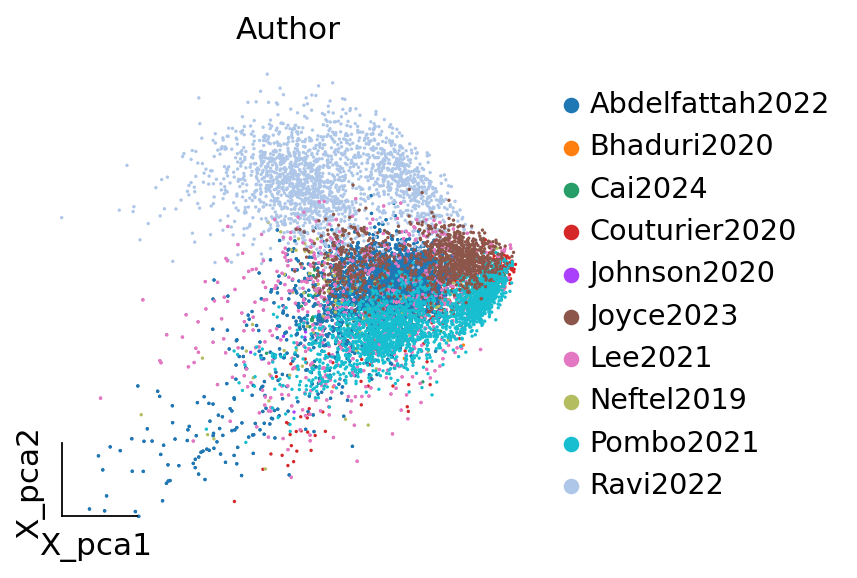

In [67]:
ov.utils.embedding(adata,
                basis='X_pca',frameon='small',
                color=['Author'],show=False,wspace=0.5)

<AxesSubplot: title={'center': 'CD3E'}, xlabel='X_pca1', ylabel='X_pca2'>

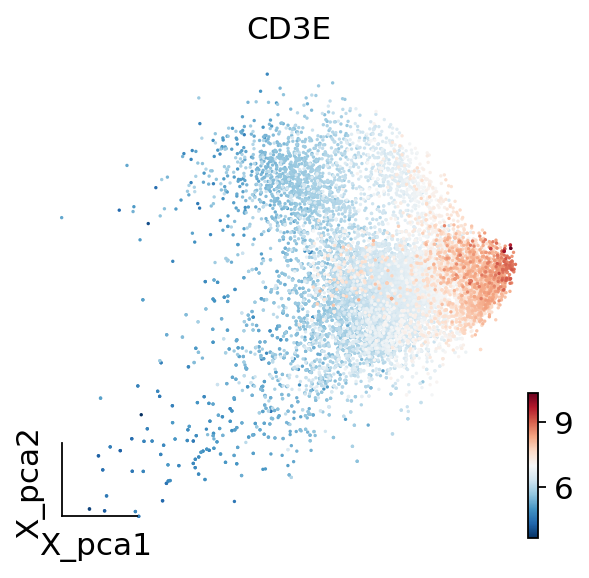

In [68]:
ov.utils.embedding(adata[adata[:, "CD3E"].X >= 0.1],
                basis='X_pca',frameon='small',
                color=['CD3E'],show=False,wspace=0.5)

In [69]:
adata = adata[adata[:, "CD3E"].X >= 0.1]

In [70]:
adata.obs['Author'].value_counts()

Author
Abdelfattah2022    5488
Pombo2021          2260
Ravi2022           1969
Lee2021            1366
Joyce2023          1069
Couturier2020       338
Cai2024             213
Neftel2019          145
Johnson2020          13
Bhaduri2020          12
Name: count, dtype: int64

In [71]:
ov.pp.neighbors(adata, n_neighbors=15, n_pcs=50,
               use_rep='scaled|original|X_pca')


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [72]:
%%time
ov.pp.umap(adata)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:12)
CPU times: user 13.8 s, sys: 34.9 s, total: 48.7 s
Wall time: 12.7 s


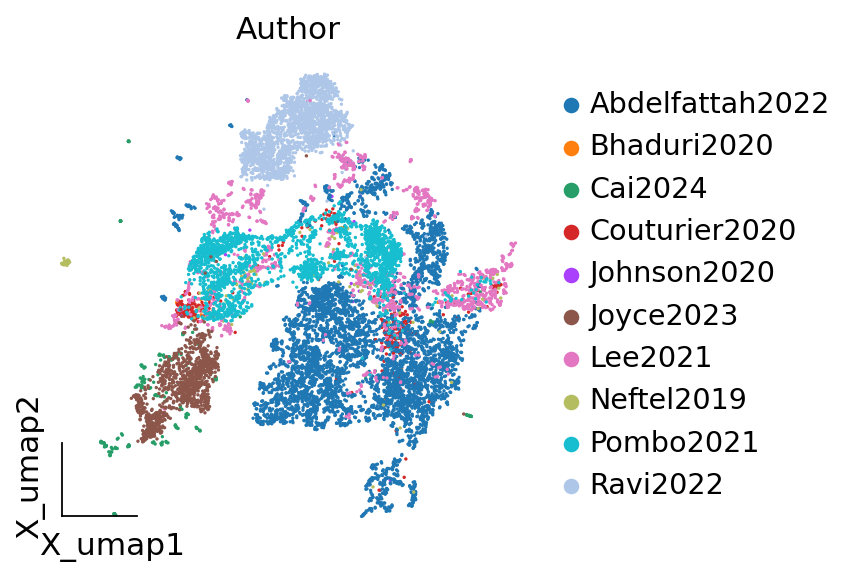

In [73]:
ov.pl.embedding(adata,
                basis='X_umap',
                color='Author',
                frameon='small')

# Harmony Correction

In [74]:
ov.single.batch_correction(adata,batch_key=['Author','assay'],
                                        methods='harmony',n_pcs=30)
adata

...Begin using harmony to correct batch effect


2025-05-26 11:12:09,325 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-26 11:12:19,162 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-26 11:12:19,239 - harmonypy - INFO - Iteration 1 of 10
2025-05-26 11:12:28,882 - harmonypy - INFO - Iteration 2 of 10
2025-05-26 11:12:37,635 - harmonypy - INFO - Iteration 3 of 10
2025-05-26 11:12:45,114 - harmonypy - INFO - Iteration 4 of 10
2025-05-26 11:12:51,459 - harmonypy - INFO - Iteration 5 of 10
2025-05-26 11:12:56,001 - harmonypy - INFO - Iteration 6 of 10
2025-05-26 11:13:00,710 - harmonypy - INFO - Iteration 7 of 10
2025-05-26 11:13:04,496 - harmonypy - INFO - Iteration 8 of 10
2025-05-26 11:13:06,631 - harmonypy - INFO - Iteration 9 of 10
2025-05-26 11:13:11,008 - harmonypy - INFO - Iteration 10 of 10
2025-05-26 11:13:14,830 - harmonypy - INFO - Stopped before convergence


AnnData object with n_obs × n_vars = 12873 × 2000
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'log1p', 'hvg', 'pca', 'scaled|original|pca_var_ratios', 'scaled|original|cum_sum_eigenvalues', 'Author_colors', 'neighbors', 'umap'
    obsm: 'X_cnv', 'X_harmony', 'X_pca', 'X_umap', 'scaled|original|X_pca'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'lognorm', 'scaled'
    obsp: 'distances', 'connectivities

In [75]:
adata.obsm['X_harmony'].shape

(12873, 50)

In [76]:
#adata.obsm['X_pca'] = adata.obsm['X_harmony']

In [77]:
ov.pp.neighbors(adata, n_neighbors=15, n_pcs=50,
               use_rep='X_harmony')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [78]:
%%time
ov.pp.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:10)
CPU times: user 11.2 s, sys: 4.46 s, total: 15.6 s
Wall time: 10.7 s


# Check Embedding

ov.pl.embedding(adata,
                basis='X_umap',
                color=['annotation_level_2'],wspace=0.5,ncols=1,
                frameon='small')

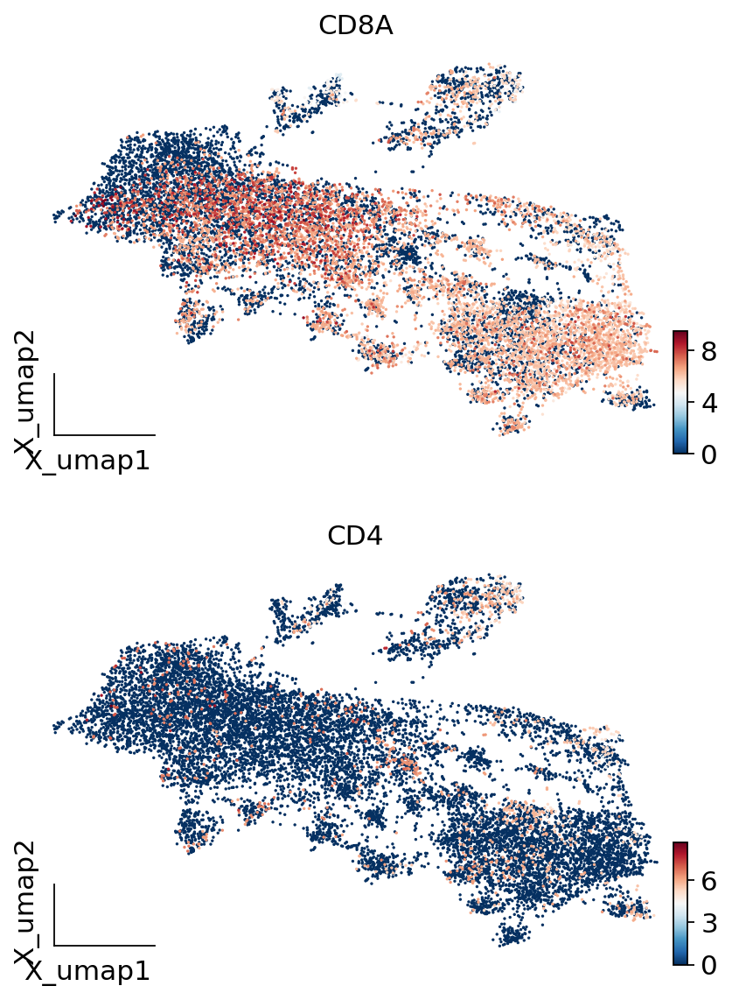

In [79]:
ov.pl.embedding(adata,
                basis='X_umap',
                color=['CD8A','CD4'],wspace=0.5,ncols=1,
                frameon='small')

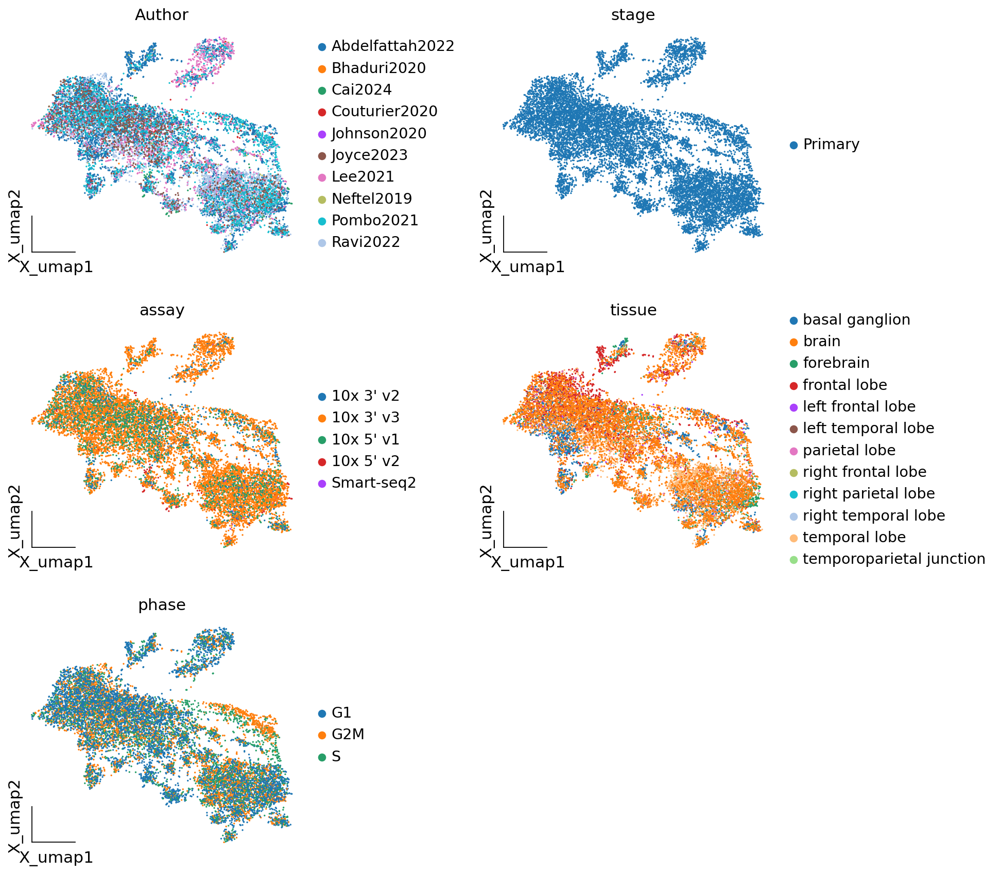

In [80]:
ov.pl.embedding(adata,
                basis='X_umap',
                color=['Author','stage','assay','tissue','phase'],wspace=0.5,ncols=2,
                frameon='small')

# Resolution 0.2

In [81]:
ov.utils.cluster(adata,method='leiden',resolution=0.2)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


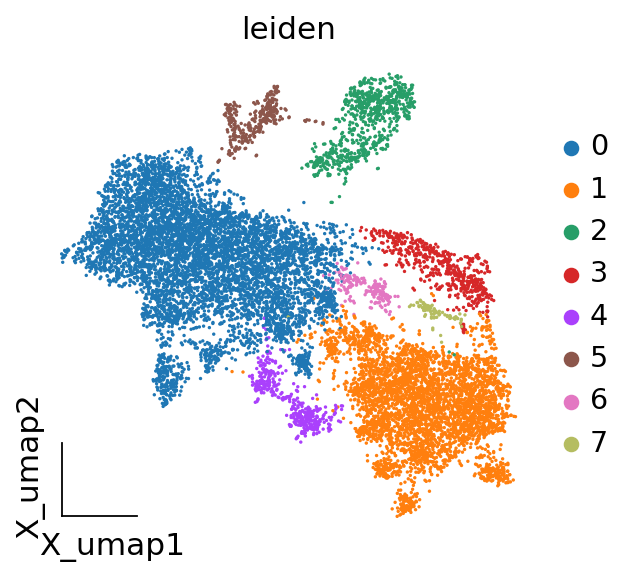

In [82]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden'],
                   frameon='small',wspace=0.5)

In [83]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon',use_raw=False,pts=0.20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [84]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/GBmap/Res02_T_CD8.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(adata, group=groups[_],key='rank_genes_groups').to_excel(writer, sheet_name=groups[_],index=False)
        

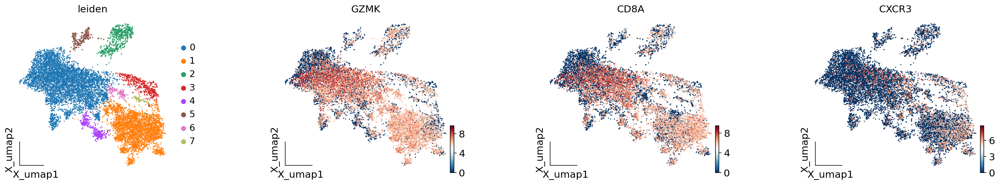

In [85]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden',"GZMK","CD8A","CXCR3"],
                   frameon='small',wspace=0.5)

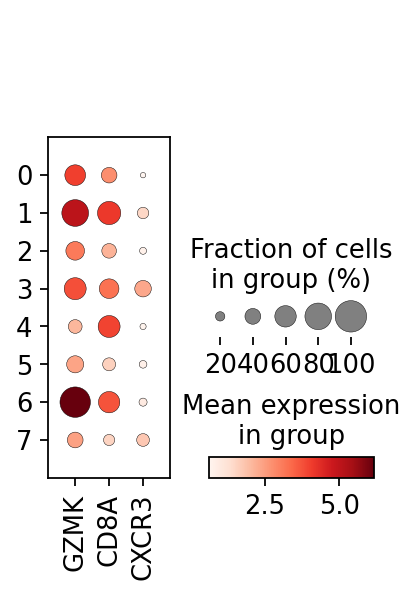

In [86]:
sc.pl.dotplot(adata,groupby="leiden",var_names=["GZMK","CD8A","CXCR3"],dendrogram=False)

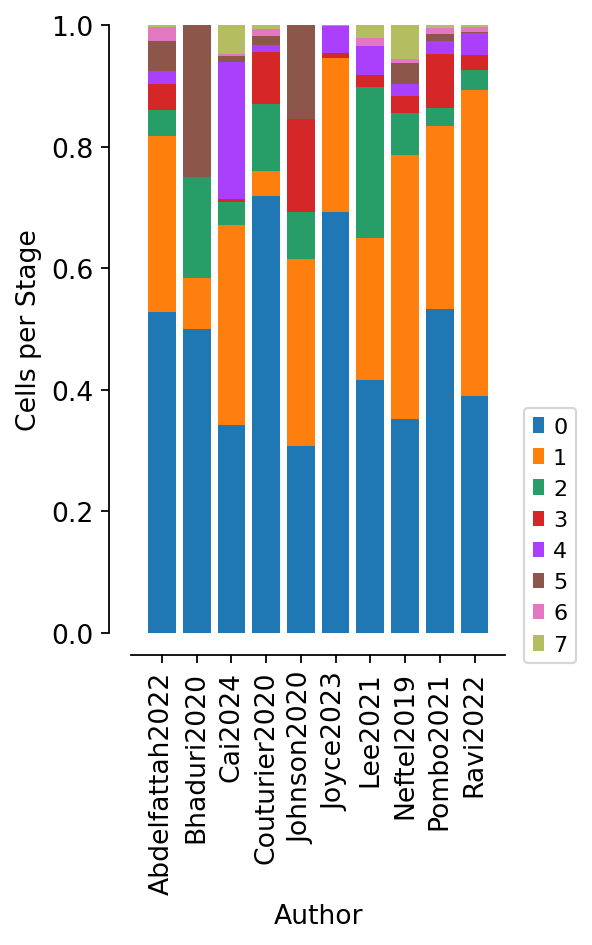

In [87]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(figsize = (3,5))
ov.pl.cellproportion(adata=adata,celltype_clusters='leiden',
                    groupby='Author',legend=True,ax=ax)

# Resolution 0.4

In [88]:
ov.utils.cluster(adata,method='leiden',resolution=0.4)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


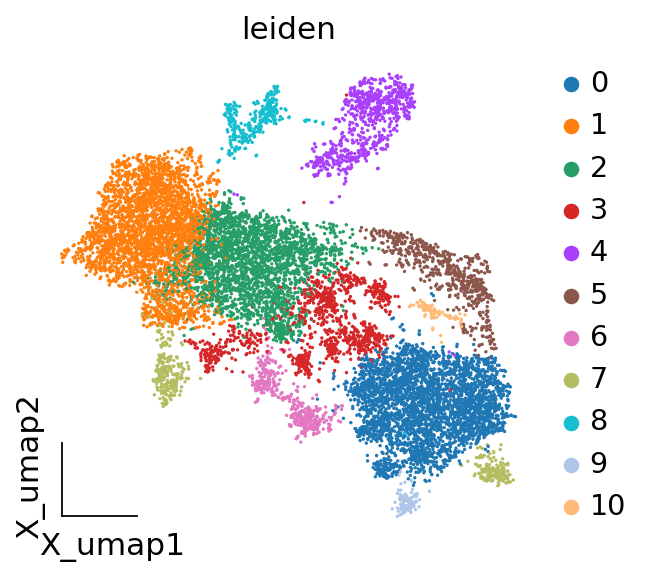

In [89]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden'],
                   frameon='small',wspace=0.5)

In [90]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon',use_raw=False,pts=0.20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [91]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/GBmap/Res04_T_CD8.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(adata, group=groups[_],key='rank_genes_groups').to_excel(writer, sheet_name=groups[_],index=False)
        

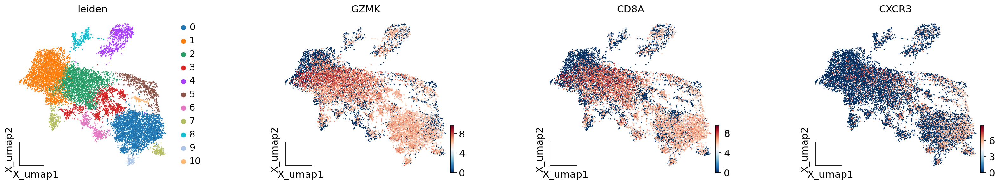

In [92]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden',"GZMK","CD8A","CXCR3"],
                   frameon='small',wspace=0.5)

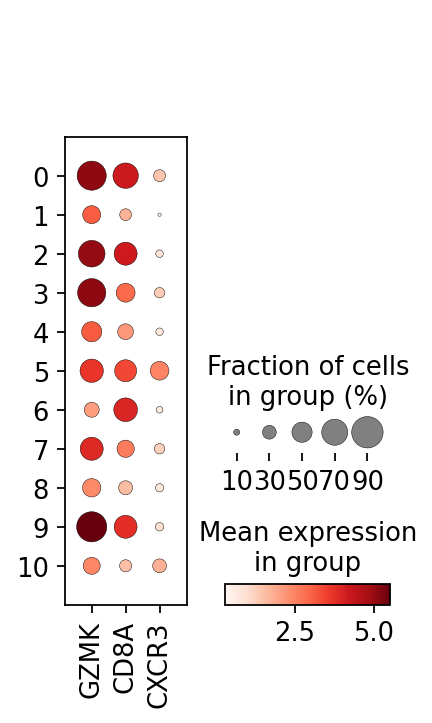

In [93]:
sc.pl.dotplot(adata,groupby="leiden",var_names=["GZMK","CD8A","CXCR3"],dendrogram=False)

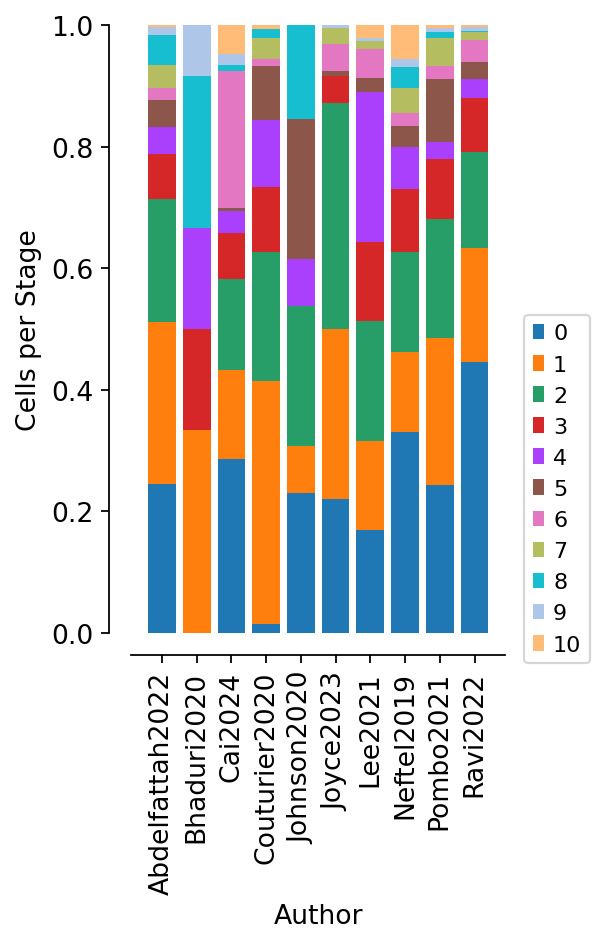

In [94]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(figsize = (3,5))
ov.pl.cellproportion(adata=adata,celltype_clusters='leiden',
                    groupby='Author',legend=True,ax=ax)

# Resolution 0.6

In [95]:
ov.utils.cluster(adata,method='leiden',resolution=0.6)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


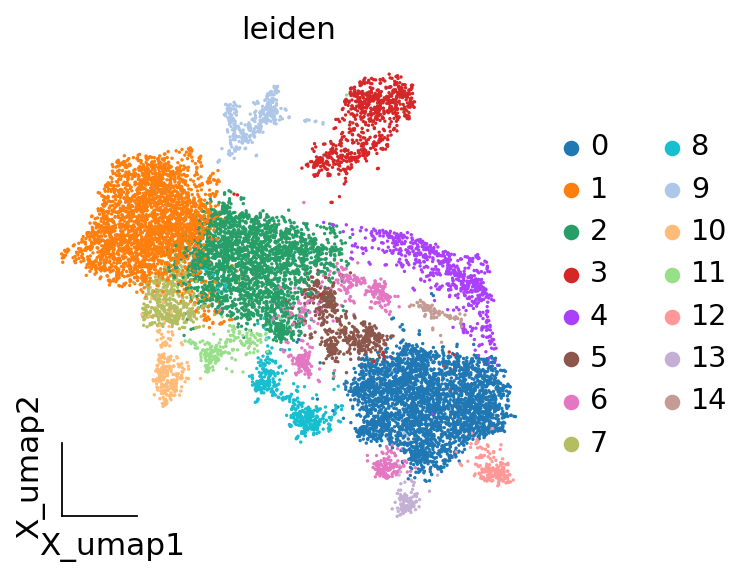

In [96]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden'],
                   frameon='small',wspace=0.5)

In [97]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon',use_raw=False,pts=0.20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [98]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/GBmap/Res06_T_CD8.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(adata, group=groups[_],key='rank_genes_groups').to_excel(writer, sheet_name=groups[_],index=False)
        

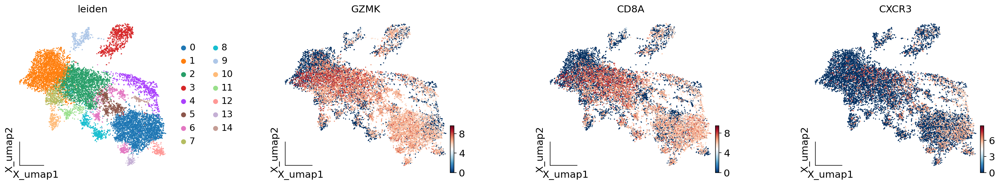

In [99]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden',"GZMK","CD8A","CXCR3"],
                   frameon='small',wspace=0.5)

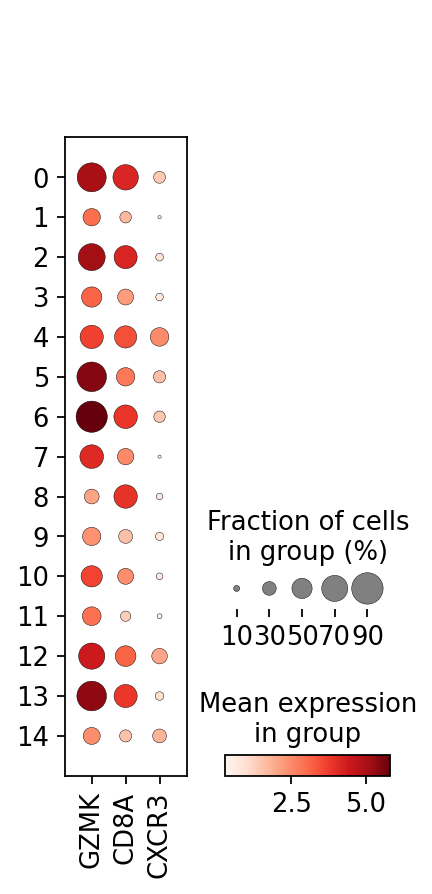

In [100]:
sc.pl.dotplot(adata,groupby="leiden",var_names=["GZMK","CD8A","CXCR3"],dendrogram=False)

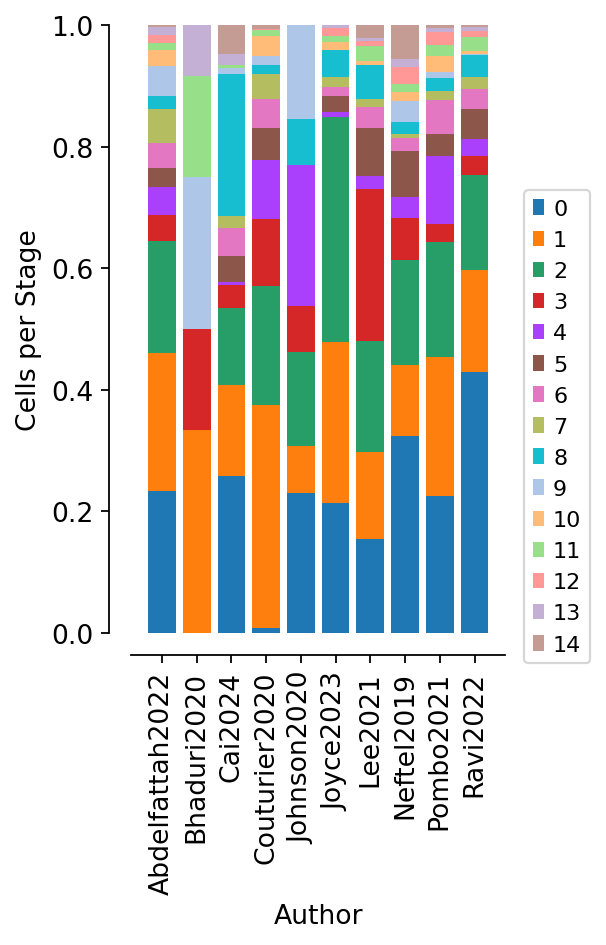

In [101]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(figsize = (3,5))
ov.pl.cellproportion(adata=adata,celltype_clusters='leiden',
                    groupby='Author',legend=True,ax=ax)

# Resolution 0.8

In [102]:
ov.utils.cluster(adata,method='leiden',resolution=0.8)

running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


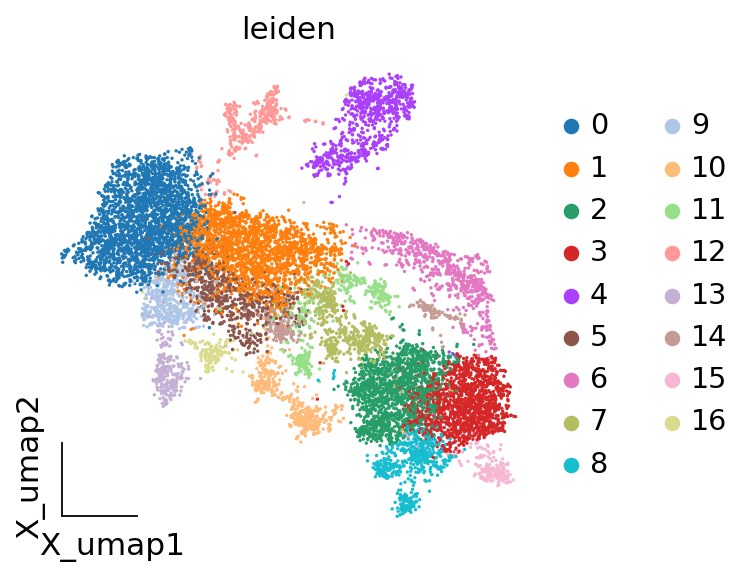

In [103]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden'],
                   frameon='small',wspace=0.5)

In [104]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon',use_raw=False,pts=0.20)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [105]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/GBmap/Res08_T_CD8.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(adata, group=groups[_],key='rank_genes_groups').to_excel(writer, sheet_name=groups[_],index=False)
        

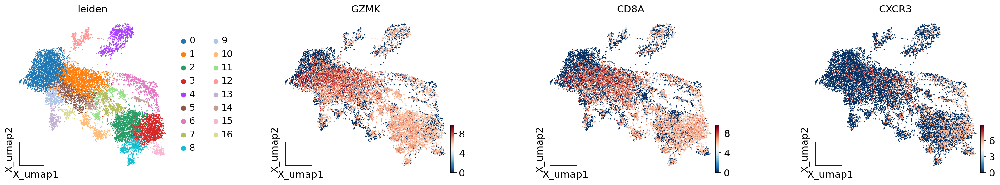

In [106]:
ov.utils.embedding(adata,basis='X_umap',
                   color=['leiden',"GZMK","CD8A","CXCR3"],
                   frameon='small',wspace=0.5)

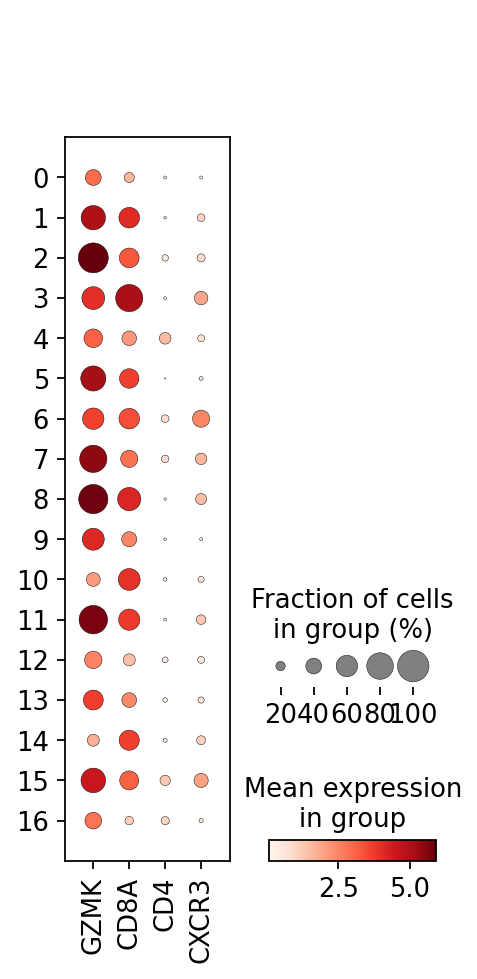

In [107]:
sc.pl.dotplot(adata,groupby="leiden",var_names=["GZMK","CD8A","CD4","CXCR3"],dendrogram=False)

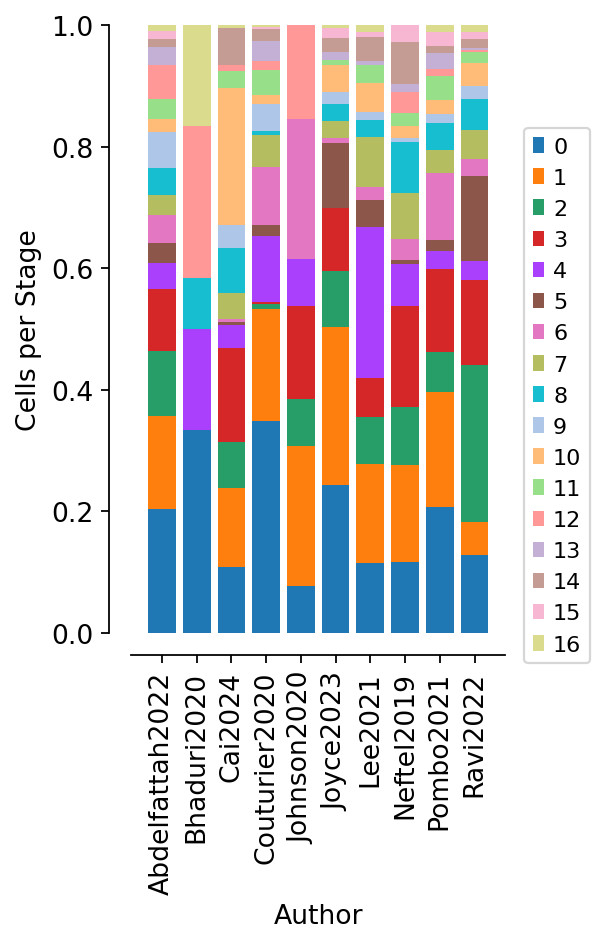

In [108]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(figsize = (3,5))
ov.pl.cellproportion(adata=adata,celltype_clusters='leiden',
                    groupby='Author',legend=True,ax=ax)

In [109]:
adata.write("/home/lugli/spuccio/Projects/SP039/GBmap/TcellCD8_Data.h5ad")